In [1]:
import pandas as pd

df = pd.read_parquet("hf://datasets/ade-benchmark-corpus/ade_corpus_v2/Ade_corpus_v2_classification/train-00000-of-00001.parquet")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Final version

In [2]:
df = df.drop_duplicates()
df=df.dropna()


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20896 entries, 0 to 23515
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    20896 non-null  object
 1   label   20896 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 489.8+ KB


In [4]:
import numpy as np
import pandas as pd
import torch
import os
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
import seaborn as sns
import matplotlib as plt
from transformers import AutoModel, BertTokenizerFast
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"


In [5]:
from transformers import AutoTokenizer, BertModel
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')

In [6]:
from nltk.corpus import stopwords, words
from nltk.tokenize import word_tokenize
import nltk
import re
import string
import pandas as pd
import numpy as np
from wordcloud import WordCloud
string.punctuation

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt_tab')
# Initialize stop words, English words corpus, and stemmer
stop_words = set(stopwords.words('english'))
english_words = set(words.words())
# stemmer = PorterStemmer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [7]:
def preprocess(text):
    text = text.lower()
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = ''.join([i for i in text if not i.isdigit()])
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(tokens)

# Apply preprocessing to the text column
df['Cleantext'] = df['text'].apply(preprocess)

In [8]:
df.head()

,text,label,Cleantext
0,Intravenous azithromycin-induced ototoxicity.,1,intravenous azithromycininduced ototoxicity
1,"Immobilization, while Paget's bone disease was...",1,immobilization pagets bone disease present per...
2,Unaccountable severe hypercalcemia in a patien...,1,unaccountable severe hypercalcemia patient tre...
3,METHODS: We report two cases of pseudoporphyri...,1,methods report two cases pseudoporphyria cause...
5,"Naproxen, the most common offender, has been a...",1,naproxen common offender associated dimorphic ...


In [9]:
X=df.Cleantext
Y=df.label
X_train, X_temp, y_train, y_temp = train_test_split(X, Y, test_size=0.20, random_state=42)

# Further split temp into test and validation
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.50, random_state=42)
print(f'(X_train: {len(X_train)}\nx_val: {len(X_val)}\nx_test: {len(X_test)})')

(X_train: 16716
x_val: 2090
x_test: 2090)


In [10]:
import numpy as np



y_train_binarized = np.array([[1, 0] if label == 0 else [0, 1] for label in y_train])
y_val_binarized = np.array([[1, 0] if label == 0 else [0, 1] for label in y_val])
y_test_binarized = np.array([[1, 0] if label == 0 else [0, 1] for label in y_test])

# Check the shape of the one-hot encoded labels
print("Manually Binarized y_train shape:", y_train_binarized.shape)  # Should be (134, 2)
print("Manually Binarized y_val shape:", y_val_binarized.shape)      # Should be (33, 2)
print("Manually Binarized y_test shape:", y_test_binarized.shape)    # Should be (33, 2)


Manually Binarized y_train shape: (16716, 2)
Manually Binarized y_val shape: (2090, 2)
Manually Binarized y_test shape: (2090, 2)


In [11]:
X_train = X_train.tolist()
y_train = y_train.tolist()
X_test = X_test.tolist()
y_test = y_test.tolist()
y_val=y_val.tolist()
X_val=X_val.tolist()


In [12]:
train_encodings = tokenizer(X_train, truncation=True, padding=True, max_length=649)
valid_encodings = tokenizer(X_val, truncation=True, padding=True, max_length=649)
test_encodings = tokenizer(X_test, truncation=True, padding=True, max_length=649)


In [13]:
class DATALOADER(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {k: torch.tensor(v[idx]) for k, v in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])  # No need to wrap in a list
        return item

    def __len__(self):
        return len(self.labels)

# convert our tokenized data into a torch Dataset
train_dataset = DATALOADER(train_encodings, y_train)
valid_dataset = DATALOADER(valid_encodings, y_val)
test_dataset = DATALOADER(test_encodings, y_test)

In [14]:
from transformers import AutoModelForSequenceClassification,AutoConfig

id2label = {0: 'Non_ADE', 1: 'ADE'}
label2id = {label: idx for idx, label in id2label.items()}

# Load and update the configuration
config = AutoConfig.from_pretrained("bert-base-cased")
config.id2label = id2label
config.label2id = label2id
config.num_labels = 2
model = AutoModelForSequenceClassification.from_pretrained("bert-base-cased",  config=config)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [15]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import matthews_corrcoef
def compute_metrics(pred):
  labels = pred.label_ids
  preds = pred.predictions.argmax(-1)
  acc = accuracy_score(labels, preds)
  mcc = matthews_corrcoef(labels, preds)
  avg_precision = average_precision_score(labels, preds)
  return {
      'accuracy': acc,'matthews_corrcoef':mcc,'avg_precision':avg_precision,
  }

In [16]:
from transformers import TrainingArguments

from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir='./bertade',
    num_train_epochs=10,
    fp16=True,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    gradient_accumulation_steps=2,
    warmup_steps=500,
    weight_decay=0.05,
    logging_dir='./logs',
    load_best_model_at_end=True,
    logging_steps=300,
    save_steps=300,
    evaluation_strategy="steps",
    save_total_limit=3,
    learning_rate=2e-5,
    lr_scheduler_type="cosine",
    report_to=None
)


/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [17]:
from transformers import  Trainer
from transformers import EarlyStoppingCallback
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=valid_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)],
)

In [18]:
import os
os.environ["WANDB_SILENT"] = "true"
os.environ["WANDB_MODE"] = "disabled"
os.environ["WANDB_DISABLED"] = "true"
os.environ["WANDB_API_KEY"] = ""  # Clear any stored API key


In [19]:
trainer.train()

wandb: WARNING The `run_name` is currently set to the same value as `TrainingArguments.output_dir`. If this was not intended, please specify a different run name by setting the `TrainingArguments.run_name` parameter.


Step,Training Loss,Validation Loss,Accuracy,Matthews Corrcoef,Avg Precision
300,0.909000,0.311898,0.855502,0.615433,0.532670
600,0.522700,0.281198,0.878947,0.691563,0.601070
900,0.414300,0.201779,0.917225,0.732378,0.668076
1200,0.307800,0.257755,0.920096,0.763380,0.691477
1500,0.269300,0.274240,0.912440,0.752631,0.674606
1800,0.182200,0.353556,0.930144,0.780826,0.718689


TrainOutput(global_step=1800, training_loss=0.4342210133870443, metrics={'train_runtime': 656.6479, 'train_samples_per_second': 254.566, 'train_steps_per_second': 7.949, 'total_flos': 3607437568946400.0, 'train_loss': 0.4342210133870443, 'epoch': 3.442105263157895})

# ROC Plot

## ROC Plot for train dataset

In [20]:
predictionstrain = trainer.predict(train_dataset)
logitstrain = predictionstrain.predictions
true_labelstrain = predictionstrain.label_ids


In [21]:
import torch
import numpy as np

logitstrain = torch.tensor(logitstrain)

if logitstrain.ndimension() == 1:
    probabilitiestrain = torch.sigmoid(logitstrain).unsqueeze(1)
    probabilitiestrain = torch.cat([1 - probabilitiestrain, probabilitiestrain], dim=1).numpy()
else:

    probabilitiestrain = torch.nn.functional.softmax(logitstrain, dim=1).numpy()


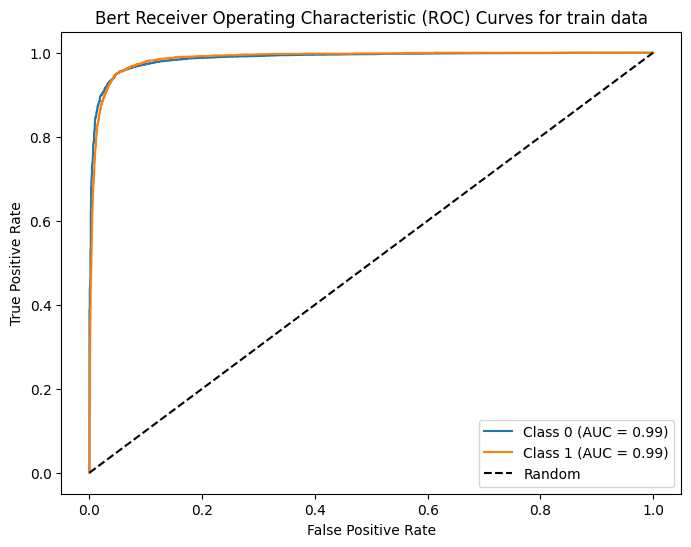

In [22]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


fpr = {}
tpr = {}
roc_auc = {}

# For each class (0 and 1)
for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_train_binarized[:, i], probabilitiestrain[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(2):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Bert Receiver Operating Characteristic (ROC) Curves for train data')
plt.legend(loc='lower right')
plt.show()




---



---

## ROC plot for test dataset

In [23]:
predictions = trainer.predict(test_dataset)
logits = predictions.predictions
true_labels = predictions.label_ids


In [24]:
import torch
import numpy as np

logits = torch.tensor(logits)

if logits.ndimension() == 1:
    probabilities = torch.sigmoid(logits).unsqueeze(1)
    probabilities = torch.cat([1 - probabilities, probabilities], dim=1).numpy()
else:
    probabilities = torch.nn.functional.softmax(logits, dim=1).numpy()  # Shape: (n_samples, 2)


<ipython-input-25-a991a88a5789>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  probabilities = torch.nn.functional.softmax(torch.tensor(logits), dim=1).numpy()


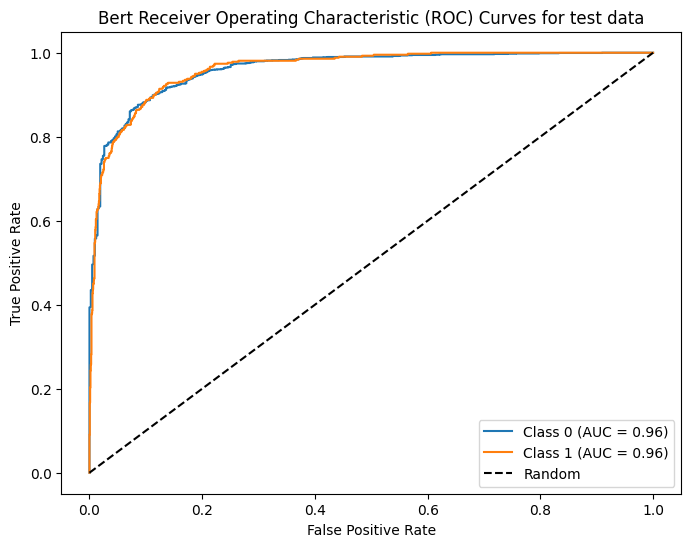

In [25]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

probabilities = torch.nn.functional.softmax(torch.tensor(logits), dim=1).numpy()

fpr = {}
tpr = {}
roc_auc = {}

for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], probabilities[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(2):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')  # Diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Bert Receiver Operating Characteristic (ROC) Curves for test data')
plt.legend(loc='lower right')
plt.show()


## Saved model

In [41]:
# saving the fine tuned model & tokenizer
model_path = "/content/drive/MyDrive/ADE/bert-base-case_F"
model.save_pretrained(model_path)
tokenizer.save_pretrained(model_path)

('/content/drive/MyDrive/ADE/bert-base-case_F/tokenizer_config.json',
 '/content/drive/MyDrive/ADE/bert-base-case_F/special_tokens_map.json',
 '/content/drive/MyDrive/ADE/bert-base-case_F/vocab.txt',
 '/content/drive/MyDrive/ADE/bert-base-case_F/added_tokens.json',
 '/content/drive/MyDrive/ADE/bert-base-case_F/tokenizer.json')

## Evaluated model

In [27]:
trainer.evaluate()

{'eval_loss': 0.2017790675163269,
 'eval_accuracy': 0.9172248803827752,
 'eval_matthews_corrcoef': 0.7323775765720865,
 'eval_avg_precision': 0.6680759185574365,
 'eval_runtime': 7.5906,
 'eval_samples_per_second': 275.34,
 'eval_steps_per_second': 17.258,
 'epoch': 3.442105263157895}

In [28]:
eval_results =trainer.evaluate(test_dataset)

# Predict on the evaluation dataset to get logits
predictions = trainer.predict(test_dataset)

In [29]:
eval_results

{'eval_loss': 0.20165258646011353,
 'eval_accuracy': 0.9244019138755981,
 'eval_matthews_corrcoef': 0.7527541687349398,
 'eval_avg_precision': 0.6906170545837838,
 'eval_runtime': 10.9937,
 'eval_samples_per_second': 190.108,
 'eval_steps_per_second': 11.916,
 'epoch': 3.442105263157895}

In [30]:
import numpy as np

# Extract true labels
true_labels = predictions.label_ids

# Extract predicted labels (argmax over logits)
preds = np.argmax(predictions.predictions, axis=1)


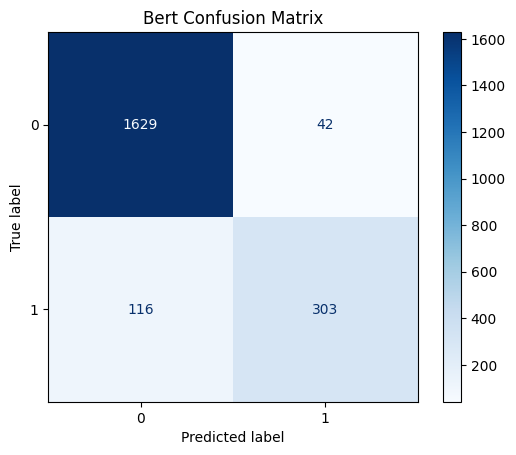

In [31]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
labels = ['0', '1']

# Compute the confusion matrix
cm = confusion_matrix(true_labels, preds)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap=plt.cm.Blues)

plt.title('Bert Confusion Matrix')
plt.show()


In [32]:
from sklearn.metrics import classification_report

# Assuming true_labels and preds are already defined
print(classification_report(true_labels, preds, target_names=labels))


              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1671
           1       0.88      0.72      0.79       419

    accuracy                           0.92      2090
   macro avg       0.91      0.85      0.87      2090
weighted avg       0.92      0.92      0.92      2090



#Shap

In [42]:
import shap
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch

model_path = "/content/drive/MyDrive/ADE/bert-base-case_F"

tokenizer = AutoTokenizer.from_pretrained(model_path)
model1 = AutoModelForSequenceClassification.from_pretrained(model_path)

pred = transformers.pipeline(
    "text-classification",
    model=model1,
    tokenizer=tokenizer,
    device=0,
    return_all_scores=True,
)

Device set to use cuda:0
/usr/local/lib/python3.10/dist-packages/transformers/pipelines/text_classification.py:106: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [43]:
masker = shap.maskers.Text(tokenizer=r"\W+")
explainer= shap.Explainer(pred, masker)

In [ ]:
!pip install datasets

In [44]:
from datasets import Dataset

data_dict = {
    'text': X_test,
    'label': y_test
}

test_data = Dataset.from_dict(data_dict)

In [45]:
data = pd.DataFrame({"text": test_data["text"], "Lable": test_data["label"]})

In [46]:
data[5:8]

,text,Lable
5,methods yearold woman became stuporous overdos...,1
6,prevented prompt recognition specific treatment,0
7,result evidence investigation adoptive parents...,0


In [47]:
shap_values = explainer(data["text"][5:8])

In [48]:
shap.plots.text(shap_values)

# Bertviz

## None ADE Sample

In [ ]:
! pip install bertviz

In [51]:
model1 = AutoModel.from_pretrained(model_path, output_attentions=True)
tokenizer = AutoTokenizer.from_pretrained(model_path)

text_batch = data["text"][6:7].tolist()

encoded_inputs = tokenizer(text_batch, return_tensors='pt', padding=True, truncation=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model1.to(device)
encoded_inputs = {key: value.to(device) for key, value in encoded_inputs.items()}

# Run the model
outputs = model1(**encoded_inputs)

attentions = outputs.attentions

tokens = tokenizer.convert_ids_to_tokens(encoded_inputs['input_ids'][0])



In [52]:
from bertviz import head_view
head_view(attentions, tokens)

<IPython.core.display.Javascript object>

In [53]:
from bertviz import model_view

model_view(attentions, tokens)

<IPython.core.display.Javascript object>

## ADE Sample

In [54]:
text_batch = data["text"][5:6].tolist()  # Ensure this is a list of strings

# Tokenize the input text
encoded_inputs = tokenizer(text_batch, return_tensors='pt', padding=True, truncation=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model1.to(device)
encoded_inputs = {key: value.to(device) for key, value in encoded_inputs.items()}

outputs = model1(**encoded_inputs)

attentions = outputs.attentions

tokens = tokenizer.convert_ids_to_tokens(encoded_inputs['input_ids'][0])

head_view(attentions, tokens)

<IPython.core.display.Javascript object>

In [55]:
from bertviz import model_view

model_view(attentions, tokens)

<IPython.core.display.Javascript object>

# Lime

## Non ADE Sample

In [ ]:
!pip install lime


In [57]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification

model = AutoModelForSequenceClassification.from_pretrained(model_path)
tokenizer = AutoTokenizer.from_pretrained(model_path)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

def predict_probab(texts):
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True)
    inputs = {key: value.to(device) for key, value in inputs.items()}
    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)
    probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    return probs.cpu().numpy()

from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=["negative", "positive"])
text = data["text"].iloc[7]  # Get a text instance
explanation = explainer.explain_instance(text, predict_probab, num_features=10)


In [58]:
text

'result evidence investigation adoptive parents terminated'

In [59]:
explanation.show_in_notebook(text=text, labels=(1,))


In [60]:
# Get explanation as a list of features with weights
explanation_list = explanation.as_list()
print(explanation_list)


[('terminated', -0.0008381357663069996), ('adoptive', -0.0005545073401455536), ('investigation', -0.00044560665597887433), ('parents', -0.0003319361351319211), ('evidence', -0.0003017234860308598), ('result', 4.2187940612204094e-05)]


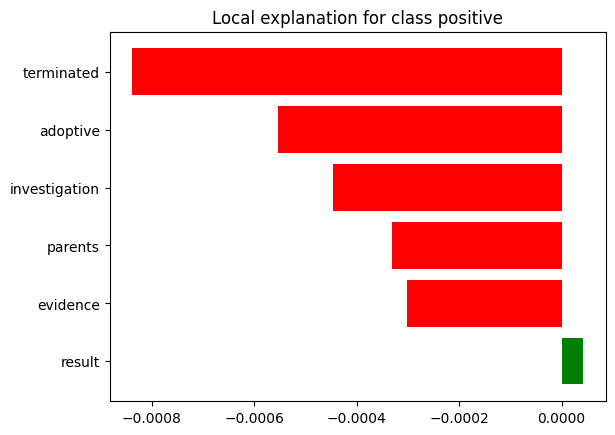

In [61]:
explanation.as_pyplot_figure()
plt.show()

## ADE Sample

In [62]:
def predict_probab(texts):
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True)
    inputs = {key: value.to(device) for key, value in inputs.items()}
    model1.eval()
    with torch.no_grad():
        outputs = model(**inputs)
    probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    return probs.cpu().numpy()

from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=["negative", "positive"])
text = data["text"].iloc[5]  # Get a text instance
explanation = explainer.explain_instance(text, predict_probab, num_features=10)

In [63]:
explanation.show_in_notebook(text=text, labels=(1,))


In [64]:
explanation_list = explanation.as_list()
print(explanation_list)

[('became', 0.11960478960943959), ('stuporous', 0.11445759506065994), ('woman', 0.10633293862738667), ('methods', -0.048074903351861216), ('overdose', 0.04473785747013416), ('lamotrigine', 0.042976536768714255), ('tablets', -0.03546325261036741), ('yearold', 0.020674694732835237), ('vpa', 0.01703989549276292), ('valproic', -0.01604719693070837)]


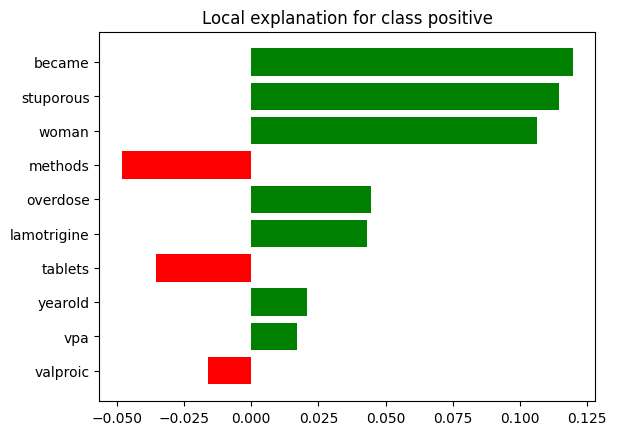

In [65]:
explanation.as_pyplot_figure()
plt.show()